# 1부. 목적에 따른 시각화 방법 정리


## I. 모델이 어떤 피처를 중요하게 보는지
---

### 1. Feature Importance 시각화

모델이 어떤 피처를 중요하게 생각하는지를 수치화하여 시각적으로 표현 

- Feature Importance 분류 및 작동방식 :
    - **전역적 피처 중요도(Global Feature Importance)**
        - 모델 전체에 대해 각 피처의 중요도를 분석
        - Built-in Importance
            - tree 기반 모델
                - 노드 불순도 감소 기반으로 중요도 계산 
                - `sklearn.feature_importances_`
            - linear 모델
                - 계수의 절대값 크기 기반으로 중요도 계산
        - Permutation Importance
            - 각 피처의 값을 무작위로 섞어 모델 성능 저하 계산(중요한 특성일수록 섞었을 때 성능 저하가 큰 것에서 착안)
            - `sklearn.inspection.permutation_importance`
        - SHapley Additive exPlanations (SHAP) Values
            - Shapley 값을 기반, 가능한 모든 피처 조합을 고려하여 기여도를 계산
            - SHAP의 `shap.Explainer(model, X)` + `shap.summary_plot()`: SHAP 괎을 활용, 전반적인 예측에 대한 각 피처의 기여도 계산
        -  ~~[ELI5](https://github.com/eli5-org/eli5) 패키지~~
    - **국소적 피처 중요도(Local Feature Importance)**
        - 개별 데이터 포인트 예측에 대한 피처 기여도를 분석
        - SHAP의 `shap.force_plot()`: SHAP 값 활용, 개별 예측에 대한 각 피처의 기여도 계산
        - LIME의 `explain_instance()`: 특정 예측을 지역적으로 해석 가능한 모델(선형모델)을 학습시켜 근사 후 이 지역 모델의 계수를 통해 특성 중요도 도출

- **SHAP, ELI5, InterpretML, Captum** 등 다양한 라이브러리 사용 가능

- 관련 논문: 
    - [Breiman, L. (2001). *Random Forests*. Machine Learning.](https://link.springer.com/article/10.1023/A:1010933404324)
        - 랜덤 포레스트에서 피처 중요도를 평가하는 방법(*퍼뮤테이션 중요도* 등)을 제안: 'Internal estimates are also used to measure variable importance.'
    - [Fisher, A., Rudin, C., & Dominici, F. (2019). *All Models are Wrong, but Many are Useful: Variable Importance for Black-Box, Proprietary, or Misspecified Prediction Models*.](https://arxiv.org/abs/1801.01489)
        - 모델 클래스 의존성(Model Class Reliance, MCR)이라는 개념을 도입, 블랙박스 모델에서 피처 중요도를 평가하는 다양한 방법 제안

#### 🖼️ Feature importance 시각화 예시

##### Captum의 `captum.attr.IntegratedGradients()` 

kernel 충돌 발생으로 아래 셀들부터 실행하고 나중에 돌리귀

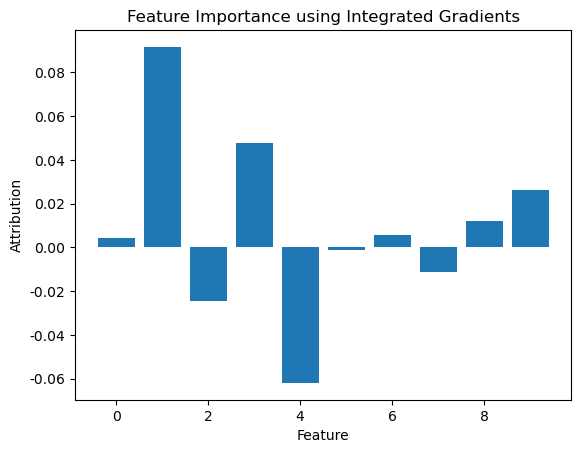

In [ ]:
# import torch
# import torch.nn as nn
# import captum
# from captum.attr import IntegratedGradients
# import matplotlib.pyplot as plt

# # Simple neural network model
# class SimpleNN(nn.Module):
#     def __init__(self):
#         super(SimpleNN, self).__init__()
#         self.fc1 = nn.Linear(10, 10)
#         self.fc2 = nn.Linear(10, 1)

#     def forward(self, x):
#         x = torch.relu(self.fc1(x))
#         x = self.fc2(x)
#         return x

# model = SimpleNN()
# model.eval()

# # Sampe data
# X = torch.rand(1, 10)

# # Calculating feature importance using Integrated Gradients
# ig = IntegratedGradients(model)
# attributions, delta = ig.attribute(X, target=0, return_convergence_delta=True)

# # Plotting the feature importance
# plt.bar(range(10), attributions.detach().numpy()[0])
# plt.xlabel('Feature')
# plt.ylabel('Attribution')
# plt.title('Feature Importance using Integrated Gradients')
# plt.show()


## II. 특정 피처가 예측값에 미치는 영향
--- 

입력 데이터가 모델에 미치는 영향을 분석


### 1. **특정 피처값 변화에 따른 예측값 변화를 시각화** : Partial Dependence Plot (PDP)

특정 피처의 값이 변할 때 모델의 예측값이 어떻게 변하는지 시각적으로 표현  
선택한 특정 피처 값에 따라 어떻게 변화(반응)하는지 분석하여 해석 가능성을 높일 수 있음   

- 작동 방식:
    - 특정 변수의 모든 샘플을 특정 값으로 대체하고, 이미 학습시킨 모델을 통해 각 샘플에 대한 예측값을 구함
        - 관심있는 특정 피처가 A일때, A의 가능한 여러 값들에 대해 모델의 예측값을 계산
        - 이때 다른 모든 피처(B, C, ...)들을 고정하지 않고 평균화(marginalizing)하여 계산 후 예측값을 시각화

- 주의점:
    - 개별 데이터 포인트가 무시됨: 개별 데이터 포인트에서 관찰될 수 있는 예측값의 변화는 확인이 어려움
    - 비선형성, 복잡성 등에 제한적: 평균적인 영향을 단순화시켜 시각화하므로 데이터의 특정 영역에서 예상치 못한 방식으로 모델이 동작할 경우 이러한 세부사항을 표현하기 어려움 (데이터포인트가 없는 부분에 기대 곡선이 표현되는 것을 외삽 extrapolation이라고 함)

|image| --- |
| --- | --- |
| 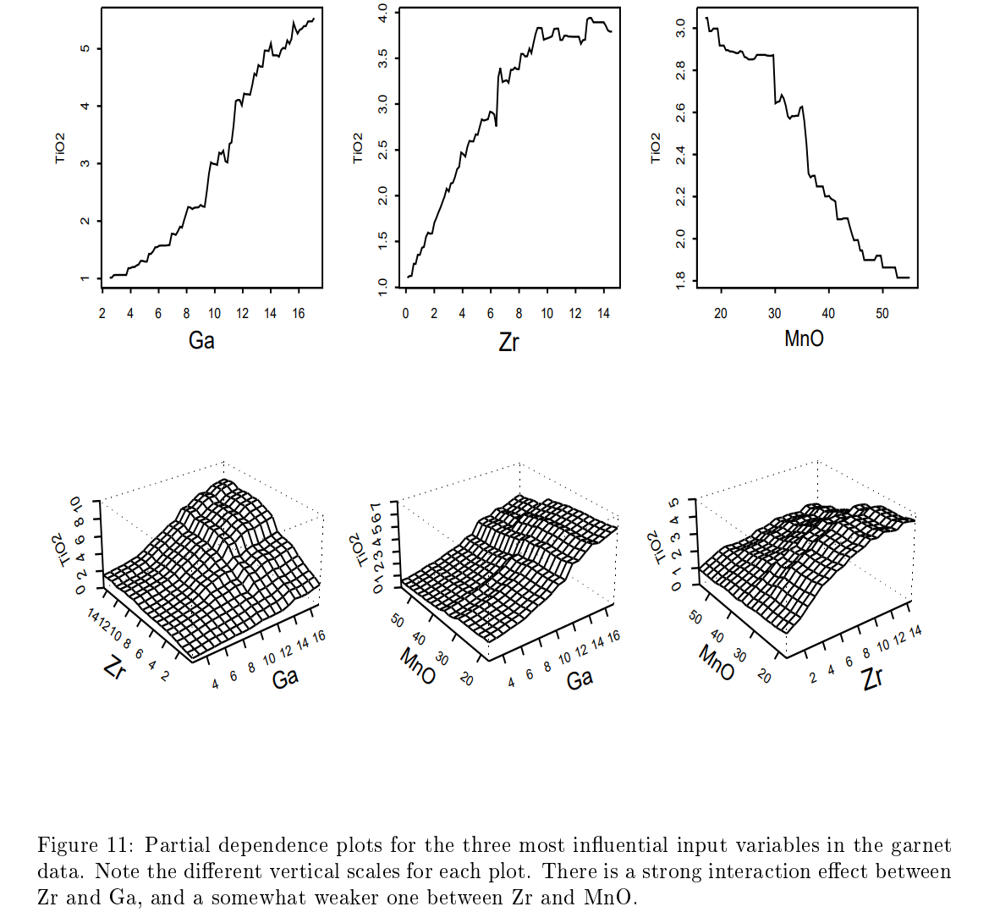 | ex1 |
|"3개의 주 영향력있는 변수들에 대한 PDP. Zr과 Ga 사이에 강한 교호작용이 보이며 Zr와  MnO는 그래보이지 않는다." (reference: *Greedy Function Approximation: A Gradient Boosting Machine* p.34) | ex | im |

</br>  

- **InterpretML**, **PDPbox**, **Scikit-learn** 등 사용 가능

    - [`interpret`](https://interpret.ml/docs/pdp.html)
    - [Scikit-learn](https://scikit-learn.org/stable/auto_examples/inspection/plot_partial_dependence.html): `sklearn.inspection.plot_partial_dependence()`
        - 1D PDP: 단일 피처의 변화에 따른 예측값 변화를 선 그래프로 표현
        - 2D PDP: 두 개의 피처가 동시에 변화할 때의 영향 분석(등고선 형태), 예측값의 크기는 색상의 차이로 표현됨 (2개의 피처로 3D도 가능)
            - `sklearn.inspection.plot_partial_dependence()`에 `features = [('feature_1', 'feature_2')]` 튜플 형태로 넣어줌  

    - [PDPbox](https://github.com/SauceCat/PDPbox) : PDP 그래프에 최적화된 패키지, [`pdpbox.pdp.PDPIsolate()`](https://pdpbox.readthedocs.io/en/latest/PDPIsolate.html)

- 관련 논문:
    - [Friedman, J. H. (2001). *Greedy Function Approximation: A Gradient Boosting Machine*. *Annals of statistics, 29(5), 1189-1232.*](https://jerryfriedman.su.domains/ftp/trebst.pdf)
        - XGBoost, PDP 개념 등장 논문, 8.2절에서 피처의 변화가 예측값에 미치는 영향을 설명
    - [Greenwell, B. M. (2017). *pdp: An R Package for Constructing Partial Dependence Plots*.](https://journal.r-project.org/archive/2017/RJ-2017-016/RJ-2017-016.pdf)
        - PDP를 쉽게 구현할 수 있는 R 패키지를 소개하고 실제 분석 사례를 포함

#### 🖼️ PDP 시각화 예시

##### PDP 1D code example

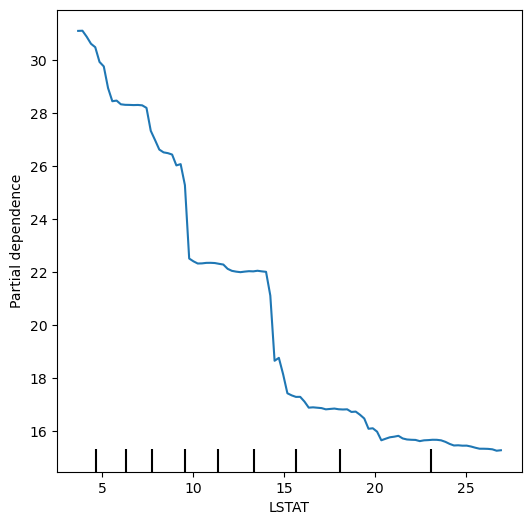

In [2]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# PDP for LSTAT
fig, ax = plt.subplots(figsize=(6, 6))
display = PartialDependenceDisplay.from_estimator(estimator=model, X=df[columns], features=['LSTAT'], ax=ax)
plt.show()

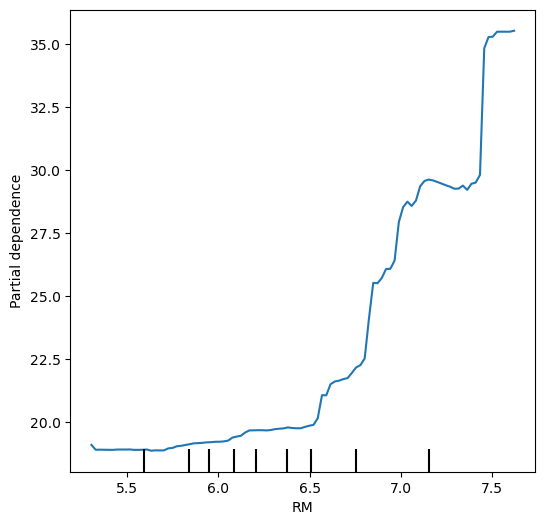

In [3]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# PDP for LSTAT
fig, ax = plt.subplots(figsize=(6, 6))
display = PartialDependenceDisplay.from_estimator(estimator=model, X=df[columns], features=['RM'], ax=ax)
plt.show()

##### PDP 2D code example

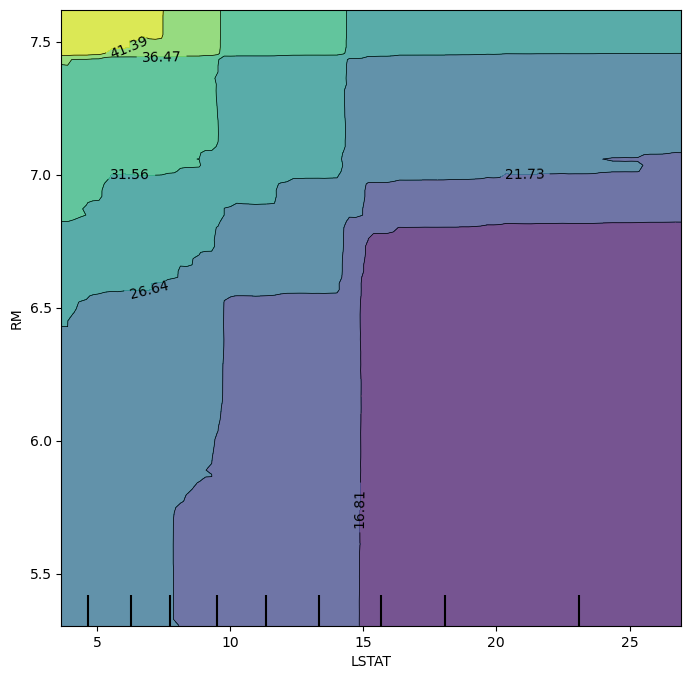

In [4]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.model_selection import train_test_split
from matplotlib import pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# PDP for LSTAT and RM
fig, ax = plt.subplots(figsize=(8, 8))
display = PartialDependenceDisplay.from_estimator(estimator=model, X=df[columns], features=[('LSTAT', 'RM')], ax=ax)
plt.show()


##### `InterpretML` 활용 시각화

In [5]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

import numpy as np
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from interpret import show
from interpret.blackbox import PartialDependence

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
pca = PCA()
model = RandomForestRegressor(n_estimators=100, random_state=617)

rf_model = Pipeline([('pca', pca), ('model', model)])
rf_model.fit(X_train, y_train)

# Plotting PDP plot
pdp = PartialDependence(rf_model, X_train)

show(pdp.explain_global(), 0)

In [6]:
# official document code

from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

import numpy as np
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from interpret import show
from interpret.blackbox import PartialDependence

seed = 617
# np.random.seed(seed)
X, y = load_breast_cancer(return_X_y=True, as_frame=True)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

pca = PCA()
rf = RandomForestClassifier(random_state=seed)

blackbox_model = Pipeline([('pca', pca), ('rf', rf)])
blackbox_model.fit(X_train, y_train)

pdp = PartialDependence(blackbox_model, X_train)

show(pdp.explain_global(), 0)

### 2. **피처 변화에 따른 개별 데이터 포인트의 예측 변화를 시각화** : Individual Conditional Expectation (ICE) Plot

 PDP의 보완적인인 형태로, 관심있는 피처의 값 변화에 따른 개별 데이터 포인트의 예측값 변화를 시각적으로 표현  
    (PDP는 모든 샘플에 대한 평균적인 영향을 보여준다면 ICE plot은 개별 데이터 포인트에 대한 영향을 모두 시각화)

- 작동 방식: 
    - ICE plot은 모든 샘플을 선으로 그리는 것으로 전체 n개 샘플만큼 n개의 선이 그려짐
    - 라인들이 서로 평행하지 않고 교차하거나 다른 방향으로 움직이면 이는 해당 피처가 다른 피처들과 상호작용함을 의미함
    - 개별 데이터 포인트마다 별도의 선으로 표현되므로 피처가 변함에 따라 특정 데이터 포인트가 어떻게 반응하는지 추적할 수 있음

- 주의점
    - 샘플 수가 많거나 변수의 cardinality가 클 수록 연산량 급격히 증가: 샘플 수가 많으면 샘플링 한 뒤 시각화 하는 것이 좋음음
    - 변수 간의 상관성이 높을 때 비정상적인 시각화가 생성될 수 있음


|image| --- |
| --- | --- |
| 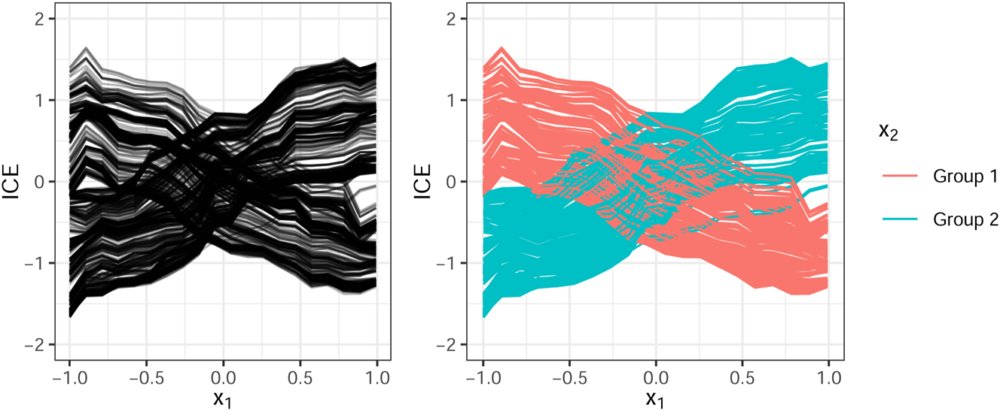 | ex1 |
|그림2: 같은 ICE 그래프에서 색상으로 다른 피처를 구분했을때 (reference: *Detecting interactions with random forests: a comment on Gries’ words*)  | ex | im |


- **InterpretML**, **PDPbox**, **Scikit-learn** 등 사용 가능  

    - [Scikit-learn](https://scikit-learn.org/stable/auto_examples/inspection/plot_partial_dependence.html) : 
        - `sklearn.inspection.partial_dependence()`의 옵션에 `kind='individual'`.   
        (`'both'`로 설정하면 PDP도 그려주지만 같은 색상으로 표시됨. `'average'`로 옵션을 주면 원래의 PDP 값을 시각화 가능)

     
- 관련 논문:
    -  (PDP 설명 2번째 논문) 
    - [Strobl, Carolin; Rothacher, Yannick; Theiler, Sven; Henninger, Mirka (2024). *Detecting interactions with random forests: a comment on Gries’ words*](https://www.degruyterbrill.com/document/doi/10.1515/cllt-2024-0028/html)
        - ICE 플롯이 interaction 효과를 감지하는데 도움이 되는 것에 대해 설명
    -  [*Deep learning speeds up ice flow modelling by several orders of magnitude*]()

#### 🖼️ ICE plot 시각화 예시

##### Scikitlearn 에서 ICE plot 시각화

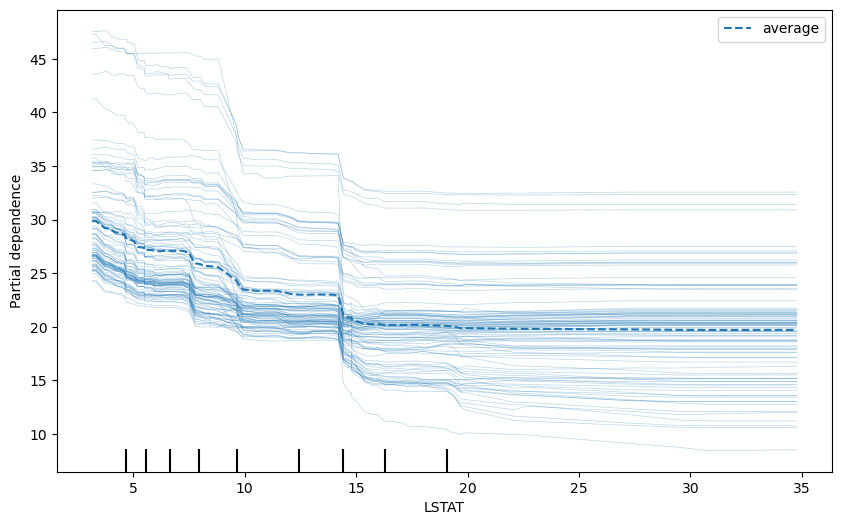

In [7]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# Train a RandomForestRegressor model
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# Create ICE plot and PDP for the 'LSTAT' feature
fig, ax = plt.subplots(figsize=(10, 6))
display = PartialDependenceDisplay.from_estimator(model, X_test, ['LSTAT'], kind='both', ax=ax)
plt.show()

### 3. **특정 피처값이 변할 때 피처의 기여도(SHAP)의 변화를 시각화** : SHAP Dependence Plot 

특정 피처의 값이 변할 때 SHAP 값(피처의 기여도)이 어떻게 변하는지를 분석  
dependence plot은 교호작용 확인에 용이

- 작동 방식:
    - 특정 피처와 해당 피처의 SHAP값을 시각화하여 X축에 피처 값, Y축에 SHAP 값(모델 기여도)를 표시
    - 특히 색상으로 상관관계가 있는 다른 피처를 나타낼수 있음(관계성 분석 가능)

- 주의점:  
    - SHAP값은 가능한 모든 피처 조합에 대해 계산하므로 계산 비용이 높을 수 있음: 값에 근사하는 방법도 있음(Kernel SHAP 사용용)
    - 데이터 불균형, 이상치 등 데이터 분포에 SHAP값이 민감하게 반응하기도 함함
    - 서로 다른 피처와의 상호작용을 시각화 할 수 있지만 해석 시 피처 이해도 필요

-  **SHAP**, **XGBoost** 등 사용 가능 (**shapviz**는 R에서 가능능)
    - [SHAP Dependence plot](https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/tree_based_models/NHANES%20I%20Survival%20Model.html#SHAP-Dependence-Plots)


- 관련 논문:
    - [Lundberg, S. M., & Lee, S.-I. (2017). *A Unified Approach to Interpreting Model Predictions*. NeurIPS.](https://arxiv.org/abs/1705.07874)
        - SHAP 값을 기반으로 피처 중요도를 계산하고 예측을 해석하는 방법을 제안
    - [Covert, I., Lundberg, S. M., & Lee, S.-I. (2020). *Understanding Global Feature Contributions With Additive Importance Measures*. NeurIPS.](https://arxiv.org/abs/2004.00668)
        - SHAP의 일부 한계를 보완하기위해 소개된 Shapley Additive Global importancE(SAGE) 
        - SHAP는 로컬과 글로벌 모두 다루지만 보다 포괄적인 전역적 설명에 초점을 두고 있으며 모델 전체 성능에 대한 각 특성의 기여도 측정

#### 🖼️ SHAP Dependence plot 시각화 예시

##### SHAP의 `shap.dependence_plot`

c:\Users\djroz\anaconda3\envs\py3_10\lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



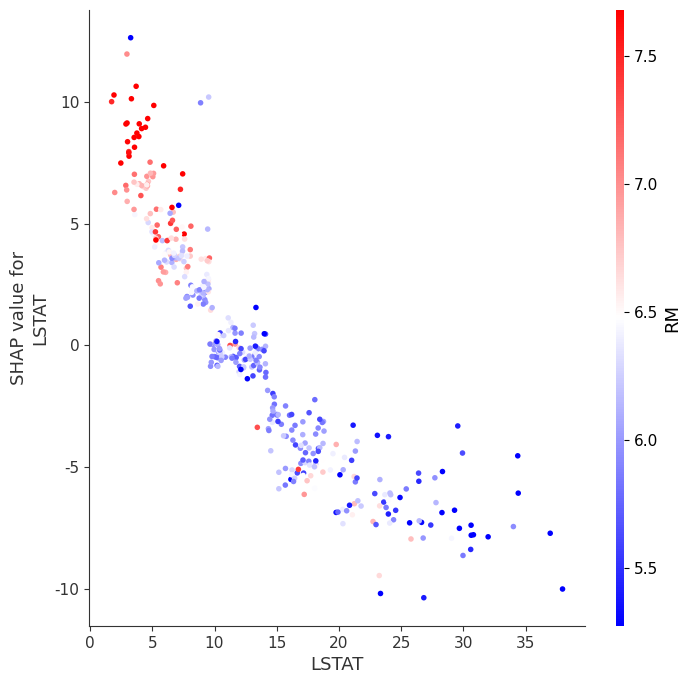

In [8]:
import xgboost as xgb
import shap

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

import matplotlib.pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = xgb.XGBRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# SHAP Values calculation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)


# Plotting SHAP Dependence plot
plt.rcParams['axes.unicode_minus'] = False
fig = plt.figure(figsize=(8,8))
fig.set_facecolor('white')
ax = fig.add_subplot()
shap.dependence_plot('LSTAT', 
                     shap_values, X_train, feature_names=columns, 
                     ax = ax,
                     cmap = 'bwr'
                     , interaction_index = 'RM'  # choice the feature which you want to see interaction with 
                     )

ax.set_title('SHAP Dependence Plot', fontsize=20)
plt.show()

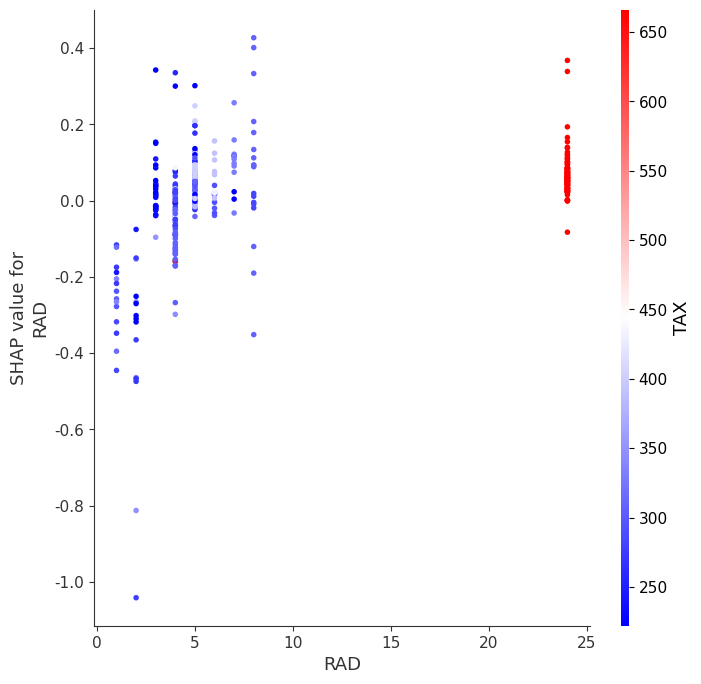

In [ ]:
# 상호작용이 명시적으로 크게 차이나지 않는 경우의 예시
# 고속도로 접근 지수와 세금과의 상호작용을 보여주는 SHAP 의존도 플롯

import xgboost as xgb
import shap

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

import matplotlib.pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = xgb.XGBRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# SHAP Values calculation
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)


# Plotting SHAP Dependence plot
plt.rcParams['axes.unicode_minus'] = False
fig = plt.figure(figsize=(8,8))
fig.set_facecolor('white')
ax = fig.add_subplot()
shap.dependence_plot('RAD', 
                     shap_values, X_train, feature_names=columns, 
                     ax = ax,
                     cmap = 'bwr'
                     , interaction_index = 'TAX' 
                     )

ax.set_title('SHAP Dependence Plot', fontsize=20)
plt.show()

## III. 특정 데이터 포인트를 추적하고 싶을 때
---

데이터 샘플별로 모델에 미친 중요도 분석 (샘플플 단위의 개별적인 예측 결과를 해석하고자 할 때)


### 1. **특정 데이터 포인트의 기여도 시각화** : LIME Explanation Visualization

개별 데이터 포인트에 대해 피처의 기여도를 시각적으로 표현 (지역적 해석을 제공하도록 설계됨)  
데이터의 어떤 부분에 집중했는지, 어떤 영역을 결과의 근거로 사용했는지 알 수 있음

- 작동 방식:
    - 특정 데이터 포인트를 지정정
    - 막대그래프 형태로 각 피처가 예측값에 미치는 영향(긍정/부정) 표시         
    - 입력 데이터가 이미지의 경우 로컬 분석 가능  
         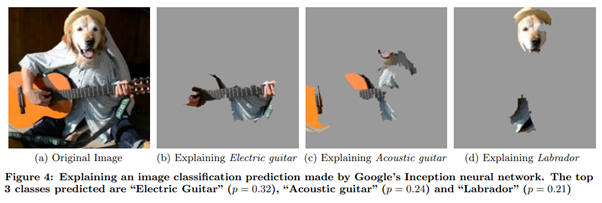   
          _이미지가 입력 데이터일 경우 '일렉기타를 치고 있는 리트리버' 사진으로 LIME을 사용해 분석한 결과. 해당 사진을 분류할 때 집중한 영역을 확인할 수 있음 (reference: Ribeiro, M. T., Singh, S., & Guestrin, C. (2016). *"Why Should I Trust You?" Explaining the Predictions of Any Classifier*)_ 

- 주의점:
    - LIME은 샘플링을 통해 결정 경계를 확정 짓기 때문에 코드를 실행할 때 마다 다른 결과를 보일 수 있다. 
    [출처](https://velog.io/@tobigs_xai/1%EC%A3%BC%EC%B0%A8-%EB%8C%80%EB%A6%AC%EB%B6%84%EC%84%9DLIME)

-  **LIME**으로 정형 데이터, 자연어 데이터, 이미지 데이터 등등 사용 가능

- 관련 논문:
    - [Ribeiro, M. T., Singh, S., & Guestrin, C. (2016). *"Why Should I Trust You?" Explaining the Predictions of Any Classifier*. KDD.](https://arxiv.org/abs/1602.04938)  
        - LIME 기법을 제안, 블랙박스 모델의 개별 예측을 해석하는 방법을 설명  
    - [Garreau, D., & Luxburg, U. V. (2020). *Explaining the Explainer: A First Theoretical Analysis of LIME*.](https://arxiv.org/abs/2001.03447)
        - LIME의 수학적, 이론적 기반과 잘못된 파라미터 선택으로 인해 LIME이 중요한 피처를 놓치는 경우도 드러낸 논문
    - [남충현, 장경식 (2021). *LIME 알고리즘을 이용한 한국어 감성 분류 모델 해석*](https://koreascience.or.kr/article/JAKO202102661356109.page)
        - 학습된 모델들의 입력 문장 내 단어들 중 결과에 미친 단어들을 해석하는 데 LIME을 사용

#### 🖼️ LIME Explanation Visualization 예시

##### LIME의 `explain_instance()` 

In [10]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import lime
import lime.lime_tabular

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# train-test split
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=617)

# RF model training
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# LIME Explainer 
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT'], class_names=['price'], verbose=True, mode='regression')

# Generating explanation for a specific data point
i = 0  # first one!
exp = explainer.explain_instance(X_test[i], model.predict, num_features=5)

# Plotting the explanation
exp.show_in_notebook(show_table=True, show_all=False)

Intercept 25.58769173165686
Prediction_local [16.44480178]
Right: 17.383


### 2. **개별 샘플에 대한 예측값 형성 과정 시각화** : SHAP Force Plot

개별 데이터 샘플에 대해 예측값이 형성되는 과정을 시각적으로 표현

- 작동 방식:
    - 특정 데이터 포인트를 지정
    - 플롯 중앙에는 모델이 피처를 고려하지 않았을 때의 기본 예측값, 
    - 양측으로 모델이 예측 하는데 기여하는 정도가 길이로 표현되며, 빨강은 예측값에 양, 파랑은 음의 영향력을 가짐

- 주의점:
    - 피처가 많으면 복잡해보일 수 있음
    - 기여도 정확성 면에서, 피처간 상호작용이 많을 수록 해석이 어려워짐
    - SHAP값을 활용하기에 이상치나 결측값 등이 왜곡을 만들 수 있음: 전처리 필요

- **SHAP** [force plot](https://shap.readthedocs.io/en/latest/generated/shap.plots.force.html#shap.plots.force) 사용
    - `shap.plots.force()` , version 차이 있는것으 로보임

- 관련 논문:
    - [Lundberg, S. M., Erion, G., & Lee, S.-I. (2018). *Consistent Individualized Feature Attribution for Tree Ensembles*. ICML.](https://arxiv.org/abs/1802.03888)
        - 트리 앙상블 모델의 예측에 대한 해석을 다룬 논문, SHAP 기반 Force Plot의 형태를 포함하여 개별 예측에 대한 해석 기법을 설명  
        ![스크린샷 2025-04-08 191357.png](<attachment:스크린샷 2025-04-08 191357.png>) (p.3)
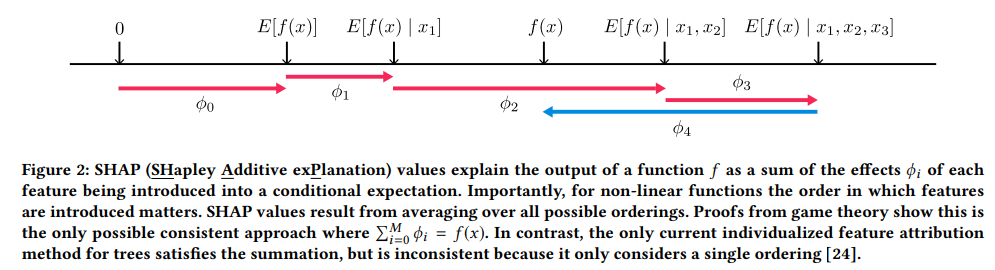

#### 🖼️ Force plot 예시

##### SHAP의 `shap.force_plot()`

개별적인 data point 지정하여 시각화

In [11]:
import pandas as pd
import numpy as np
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# train-test split
X_train, X_test, y_train, y_test = train_test_split(data, target, test_size=0.2, random_state=617)

# RF model training
model = RandomForestRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# TreeExplainer for generating SHAP values
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# Plotting SHAP force plot
data_point = X_test[0]  # Example data point to explain
shap.initjs()
shap.force_plot(explainer.expected_value, 
                shap_values[0], 
                data_point, 
                feature_names=['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT'])


#### ➕ SHAP Waterfall Plot

force plot을 세로로 늘여놓은 형태로, 개별 데이터에서의 예측에 대한 각 피처의 기여도를 이해하는 데 유용

- 작동 방식:
    - shap value를 절대값 순으로 내림차순 정렬 (절대값의 크기 = bar의 길이 )
    - bar의 시작점과 종료지점을 표시 

##### SHAP warterfall plot 시각화 예시

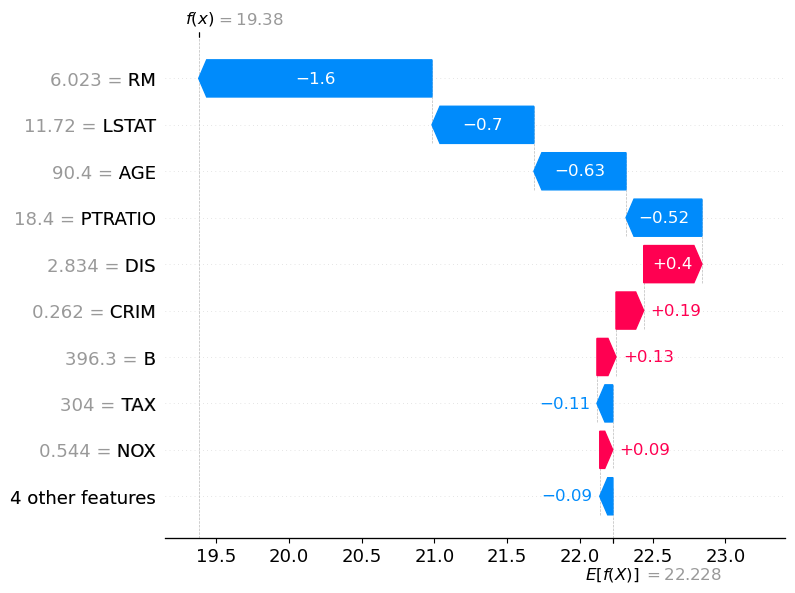

In [12]:
import xgboost as xgb
import shap

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from interpret import show
from interpret.blackbox import PartialDependence

# Data loading
data_url = "http://lib.stat.cmu.edu/datasets/boston"
raw_df = pd.read_csv(data_url, sep="\\s+", skiprows=22, header=None)
data = np.hstack([raw_df.values[::2, :], raw_df.values[1::2, :2]])
target = raw_df.values[1::2, 2]

# Create a DataFrame with the data
columns = ["CRIM", "ZN", "INDUS", "CHAS", "NOX", "RM", "AGE", "DIS", "RAD", "TAX", "PTRATIO", "B", "LSTAT"]
df = pd.DataFrame(data, columns=columns)
df['MEDV'] = target

# train-test split
X_train, X_test, y_train, y_test = train_test_split(df[columns], df['MEDV'], test_size=0.2, random_state=617)

# RF model training
model = xgb.XGBRegressor(n_estimators=100, random_state=617)
model.fit(X_train, y_train)

# SHAP
explainer = shap.Explainer(model)
shap_values = explainer(X_train)


# Plotting SHAP warterfall plot
shap.plots.waterfall(shap_values[0])

## IV. 모델 내부 표현 시각화 

### 1. **모델이 학습한 공간을 시각화** : Embedding Space Visualization

모델이 데이터를 어떻게 내재화(embedding)했는지 즉 어떻게 이해해했는지 분석  
학습한 특징(Feature)이 어떻게 분포하는지를 분석하는 데 중요  

- 사람이 이해할 수 있도록 t-SNE, UMAP을 활용하여 모델이 학습한 공간(Feature Representationn)인고차원 벡터를 2D 또는 3D로 투영  


- ➕ 모델이 학습한 공간이 왜 중요할까?

    1. 모델이 어떻게 이해했는지 분석  
    비슷한 의미의 단어, 이미지, 데이터 포인트를 모델이 가까이 배치하였는지 확인할 수 있음  
    (예: Word2Vec, BERT 임베딩에서 ‘king’과 ‘queen’이 가깝게 위치하는지 확인 가능)  

    2. 학습된 특징이 올바르게 분포하는지 검증  
    학습이 잘 되었는지 혹은 과적합(overfitting)되었는지 확인할 수 있음 
    클래스 간의 경계가 잘 형성되었는지 시각적으로 판단할 수 있다.  

    3. 고차원 데이터를 직관적으로 이해  
    NLP에서는 단어 임베딩, CV에서는 이미지 특징 임베딩이 높은 차원의 벡터로 표현됨  
    따라서 이를 저차원으로 줄여 시각화하면 데이터의 패턴을 더 쉽게 해석할 수 있음  

    4. 클러스터링 및 이상 탐지(Anomaly Detection)  
    정상적인 데이터와 이상 데이터가 잘 구분되는지 확인할 수 있음  
    따라서 이상값(Outlier) 탐지에 활용될 수도 있음  


- 주의점:
    - 직관적이지만 비선형 구조를 표현하는데 어려움이 있음  
    
        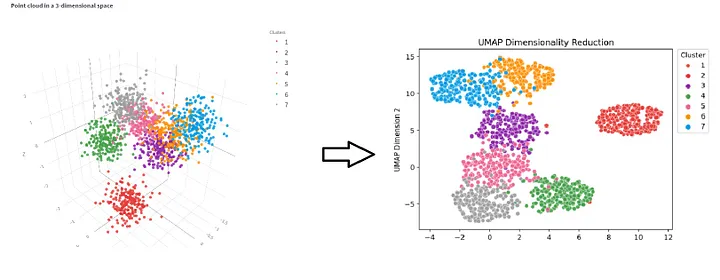  
        t-SNE를 활용했을 때의 시각화와 UMAP의 비교
        [reference](https://medium.com/mcd-unison/umap-an-alternative-dimensionality-reduction-technique-7a5e77e80982)

- `sklearn.manifold.TSNE`, `umap-learn` 등 사용 가능 

- 관련 논문: 
    - [Maaten, L. V. D., & Hinton, G. (2008). *Visualizing data using t-SNE.* ](https://www.jmlr.org/papers/v9/vandermaaten08a.html)

- 관련 영상: 
    - [Krich Naik의 Visualizing High Dimension Data Using UMAP Is A Piece Of Cake Now (fulltime 08:23)](https://www.youtube.com/watch?v=015vL0cJfA0)

### 2. **모델의 의사결정 경로 추적**: Decision Tree Feature Importance, LRP

- #### **Decision Tree Feature Importance**
    - 트리 기반 모델(XGBoost, Random Forest 등)의 의사결정 과정 시각화  

        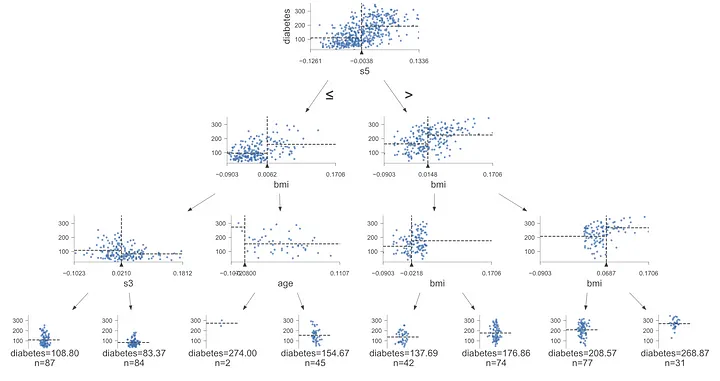  
        결정 트리 형태에 직접 분리 과정을 표현한 시각화
        [reference](https://medium.com/data-science/creating-incredible-decision-tree-visualizations-with-dtreeviz-820c6547b6a9)
   
    - **[dtreeviz](https://github.com/parrt/dtreeviz)**, `tree.export_graphviz()`, `shap.TreeExplainer()`, `eli5.show_weights()` 사용 가능

- #### **Neural Network Feature Attribution (Layer-wise Relevance Propagation, LRP)**
    - 뉴럴 네트워크가 어떤 피처를 중요하게 여겼는지 역추적
   
    - `innvestigate` 사용 가능
    
    - 관련 논문: 
        - [Bach, S., et al. (2015). "On pixel-wise explanations for non-linear classifier decisions by layer-wise relevance propagation." *PloS one, 10(7), e0130140.*](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0130140)
            - LRP(신경망의 각 레이어에서 중요도를 계산하여 개별 픽셀이 모델 예측에 기여한 것을 시각화), 픽셀 기여도를 히트맵으로 시각화

### 3. **데이터 샘플의 모델 내부 표현** : Activation Map, Attention Map 
모델이 특정 데이터를 어떻게 "이해"하고 있는지 확인하는 방법.

- #### **CNN 모델의 Activation Map (Feature Map)**
    - 특정 레이어에서 활성화된 뉴런이 원본 이미지의 어떤 영역을 활성화시키는지를 분석하는 기법
    - CNN 모델의의 중간 레이어의 활성화 값을 직접 출력하여 모델이 어떤 패턴을 감지하는지 확인 가능  
        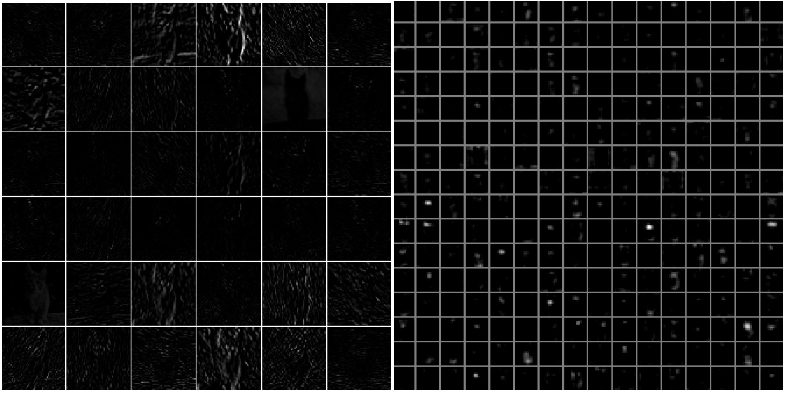  
        AlexNet의 첫 번째 컨볼루전 레이어와 다섯 번째 컨볼루전 레이어의 activation 출력, 각 이미지는 특정 필터에 해당하는 acticvation map [reference](https://nagadi.tistory.com/56#google_vignette)  

    - `torchvision.utils.make_grid()`, `tensorflow.keras.models.Model` 활용 

    - 관련 논문: 
        - [Zeiler, M. D., & Fergus, R. (2014). "Visualizing and understanding convolutional networks." *ECCV.*](https://arxiv.org/abs/1706.03762)



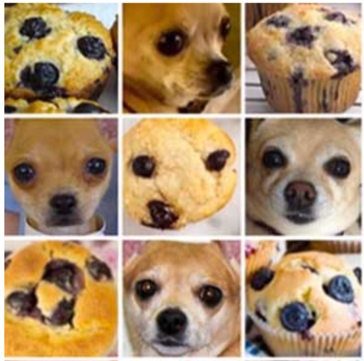


- #### **Transformer 모델의 Attention Map**
    - BERT, GPT 등의 Transformer 모델이 특정 단어 간 관계를 어떻게 인식하는지 시각화

    - `bertviz`, `transformers` 사용 가능
    - 관련 논문: 
        - [Vaswani, A., et al. (2017). *"Attention is all you need."* NeurIPS.](https://arxiv.org/abs/1311.2901)
        - [Hila Chefer, Shir Gur, Lior Wolf (2021). *"Transformer Interpretability Beyond Attention Visualization"*](https://openaccess.thecvf.com/content/CVPR2021/papers/Chefer_Transformer_Interpretability_Beyond_Attention_Visualization_CVPR_2021_paper.pdf)
            - ([논문 리뷰 블로그](https://velog.io/@sjinu/%EB%85%BC%EB%AC%B8%EB%A6%AC%EB%B7%B0Transformer-Interpretability-Beyond-Attention-Visualization))


##  V. 예측 과정의 불확실성 시각화

(모델 예측 결과의 불확실성을 다루는 개념들을 정리)

### 1. **Bayesian Model Uncertainty**   

- 베이지안 추론을 이용해 불확실성을 확률적으로 표현, 모델의 예측이 얼마나 신뢰도 있는지 확인에 유용 (Dropout + Monte Carlo)  

    <!-- 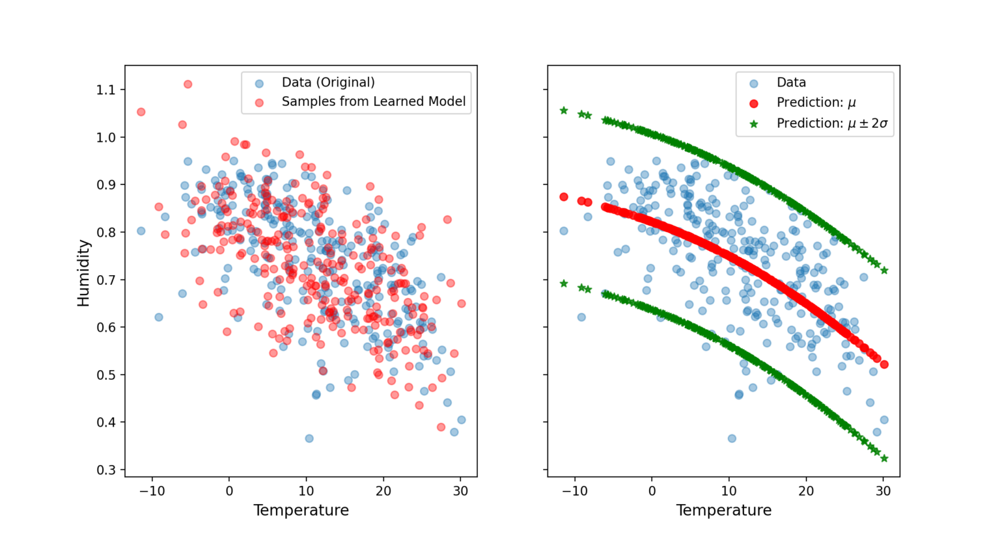  
    DNN에서 ([reference](https://towardsdatascience.com/bayesian-deep-learning-estimating-uncertainty-9907f5208cc0/)) -->


- `tensorflow-probability`, `Pyro` 사용 가능

- 관련 논문: 
    - [Gal, Y., & Ghahramani, Z. (2016). *"Dropout as a Bayesian approximation: Representing model uncertainty in deep learning."* ICML.](https://arxiv.org/abs/1506.02142)

- 관련 자료:
    - [신지태, 황혜경 (2022). *최신 AI 불확실성 정량화 동향 및 시사점*](https://www.google.com/url?sa=i&url=https%3A%2F%2Fwww.koren.kr%2Flib%2FCommon%2FCom%2FComDownload.asp%3Fttp%3Dbrd1%26tno%3D1529&psig=AOvVaw0_IA-1nSyuQBeN1Tug1M8M&ust=1744198464064000&source=images&cd=vfe&opi=89978449&ved=0CBkQ3YkBahcKEwjY5t_3q8iMAxUAAAAAHQAAAAAQBA)

### 2. **Prediction Intervals**

- Prediction Intervals: 새로운 관측값이 '특정 확률'로 포함될 것을 예상되는 값의 범위  
    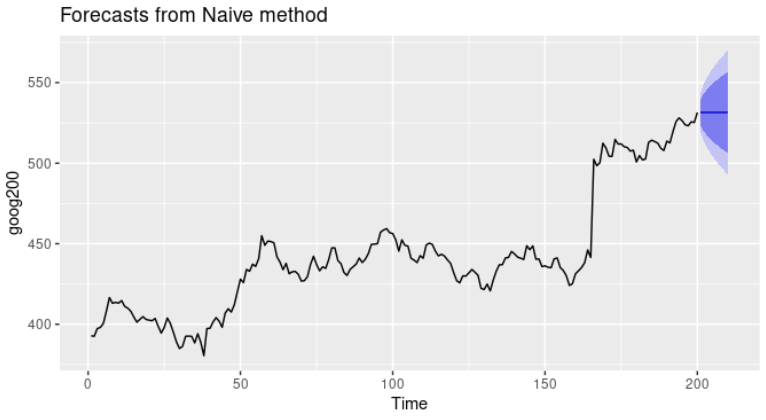  
    확률 구간에 따라 색의 강도가 다른 그래프 
    ([reference](https://otexts.com/fppkr/prediction-intervals.html#%EB%B2%A4%EC%B9%98%EB%A7%88%ED%81%AC-%EA%B8%B0%EB%B2%95))

- 관련 문서:
    - [Rob J. Hyndman, George Athanasopoulos *Forecasting: Principles and Practice* ](https://otexts.com/fppkr/prediction-intervals.html)

### 3. **Confidence Calibration**

- Confidence Calibration: 모델의 예측 확률이 실제 정답 확률과 얼마나 일치하는지 평가하는 과정 

- 관련 논문:
    - [Fabian Küppers, Anselm Haselhoff, Jan Kronenberger & Jonas Schneider (2022). *"Confidence Calibration for Object Detection and Segmentation"*](https://link.springer.com/chapter/10.1007/978-3-031-01233-4_8)